# How "green" is Canada in terms of electricity generation?
It is well known that Canada is a big player in the renewable energy, but how much of their electricity is being generated from renewables? and how has this changed over time with the addition of new renewable technologies? In this project we are going to analyze data of Canada electricity generation and try to answer those questions and get a clear picture of the energy scene in 2020 in this country. 

To do the analysis, we are going to use three datasets:
* Canadian Electricity Statistics from 1950 to 2007, which is a compound of monthly energy generation by provinces and the whole country, divided by energy sector. The dataset can be download from [here](https://open.canada.ca/data/en/dataset/4065fbe9-45a0-4247-912e-662cf0f8bce3).

* Canadian Electricity Generation from 2008 to 2020, this is the continuation of the previous dataset and it also consists in monthly data of provinces and country energy generation. The dataset can be download from [here](https://open.canada.ca/data/en/dataset/1a7fa21f-b2f2-4f85-b40d-231b4e6a94e7).

* BP's Statistical Review from World Energy, world compound of energy statistics run by the multinational company. It has data on different countries in terms of electricity generation by sector. We are going to use it to get some information of Canadian renewables. The dataset can be download from [here](https://www.bp.com/en/global/corporate/energy-economics/statistical-review-of-world-energy/downloads.html).

The Canadian Electricity Statistics from 1950 to 2007 and Canadian Electricity Generation from 2008 to 2020 datasets, are licensed under the [Open Government Licence – Canada](https://open.canada.ca/en/open-government-licence-canada).



## Data import
Now, let's import the three previously mentioned datasets:

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import json
import plotly
plotly.offline.init_notebook_mode()
pd.set_option("display.max_columns", 30) # to have a better display of the dataframes

### Canadian Electricity Statistics from 1950 to 2007

In [2]:
energy50_07 = pd.read_csv(r'data/25100001.csv', parse_dates =["REF_DATE"], index_col ="REF_DATE") 
energy50_07.head()

C:\Users\Leonardo\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning:

Columns (11,12) have mixed types.Specify dtype option on import or set low_memory=False.



,GEO,DGUID,"Electric power, components",UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
REF_DATE,,,,,,,,,,,,,,
1950-01-01,Canada,NaN,Overall total generation,Megawatt hours,210,units,0,v222432,1.117,4081000.0,NaN,NaN,NaN,0
1950-01-01,Canada,NaN,Total utility generation,Megawatt hours,210,units,0,v222421,1.106,3887000.0,NaN,NaN,NaN,0
1950-01-01,Canada,NaN,Total hydro generation,Megawatt hours,210,units,0,v222427,1.112,3911000.0,NaN,NaN,NaN,0
1950-01-01,Canada,NaN,Total available,Megawatt hours,210,units,0,v222441,1.130,3953000.0,NaN,NaN,NaN,0
1950-02-01,Canada,NaN,Overall total generation,Megawatt hours,210,units,0,v222432,1.117,3780000.0,NaN,NaN,NaN,0


### Canadian Electricity Generation from 2008 to 2020

In [3]:
energy08_20 = pd.read_csv('data/25100015.csv', parse_dates =["REF_DATE"], index_col ="REF_DATE") 
energy08_20.head()

C:\Users\Leonardo\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning:

Columns (13) have mixed types.Specify dtype option on import or set low_memory=False.



,GEO,DGUID,Class of electricity producer,Type of electricity generation,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
REF_DATE,,,,,,,,,,,,,,,
2008-01-01,Canada,2016A000011124,Total all classes of electricity producer,Total all types of electricity generation,Megawatt hours,210,units,0,v44174609,1.1.1,59082501.0,NaN,NaN,NaN,0
2008-01-01,Canada,2016A000011124,Total all classes of electricity producer,Hydraulic turbine,Megawatt hours,210,units,0,v44174610,1.1.2,36647695.0,NaN,NaN,NaN,0
2008-01-01,Canada,2016A000011124,Total all classes of electricity producer,Conventional steam turbine,Megawatt hours,210,units,0,v44174611,1.1.3,11021441.0,NaN,NaN,NaN,0
2008-01-01,Canada,2016A000011124,Total all classes of electricity producer,Nuclear steam turbine,Megawatt hours,210,units,0,v44174612,1.1.4,8963878.0,NaN,NaN,NaN,0
2008-01-01,Canada,2016A000011124,Total all classes of electricity producer,Internal combustion turbine,Megawatt hours,210,units,0,v44174613,1.1.5,105643.0,NaN,NaN,NaN,0


### BP's Statistical Review from World Energy
This dataset was extracted from the original xls file just to have the wind and biomass data. 

In [4]:
wind_biomass = pd.read_csv('data/wind_biomass.csv',index_col ="REF_DATE")
wind_biomass.head()

,WIND,BIOMASS
REF_DATE,,
1976,0.0,0.7
1977,0.0,1.1
1978,0.0,1.1
1979,0.0,1.3
1980,0.0,1.3


## Data preparation
As we want to analyze the energy scene in Canada (this as a country and by provinces) by 2020 and how has changed through time, we will generate three sub-dataframes from the three we just imported:
* The first one will be a sub-dataframe of Canadian electricity generation per province in 2020. 
* The second one will be a sub-dataframe of Canadian electricity generation in 2020 as a country.
* The last one will be a merged dataframe, containing the information of Canadian electricity generation from 1950 to 2019 (not to 2020 because the year is not over), including the renewables information from BP. 

#### Canadian Provinces Electricity generation 2020

First, we are going to isolate just the total electricity generation and remove the unnecessary columns, leaving just the province, the type of electricity and the value of generation. 

In [5]:
provinces2020 = energy08_20[energy08_20['Class of electricity producer'] == 'Total all classes of electricity producer']
provinces2020 = provinces2020[['GEO','Type of electricity generation','VALUE']]
provinces2020.head()

,GEO,Type of electricity generation,VALUE
REF_DATE,,,
2008-01-01,Canada,Total all types of electricity generation,59082501.0
2008-01-01,Canada,Hydraulic turbine,36647695.0
2008-01-01,Canada,Conventional steam turbine,11021441.0
2008-01-01,Canada,Nuclear steam turbine,8963878.0
2008-01-01,Canada,Internal combustion turbine,105643.0


Then, we are going to reshape the dataframe putting the types of electricity generation as columns headers. 

In [6]:
# set_index to generate a multiindex and preserve the province name, unstack to reshape the dataframe
provinces2020 = (provinces2020.set_index(['GEO',provinces2020.index, 'Type of electricity generation'])
                .unstack('Type of electricity generation'))
# converting from mega to giga
provinces2020 = provinces2020/1000
provinces2020.head()

VALUE                             \
Type of electricity generation Combustion turbine Conventional steam turbine   
GEO     REF_DATE                                                               
Alberta 2008-01-01                        799.878                   4388.878   
        2008-02-01                        779.246                   3966.047   
        2008-03-01                        803.235                   4130.716   
        2008-04-01                        812.127                   3743.258   
        2008-05-01                        808.616                   3886.628   

                                                                              \
Type of electricity generation Hydraulic turbine Internal combustion turbine   
GEO     REF_DATE                                                               
Alberta 2008-01-01                       135.167                       7.341   
        2008-02-01                       118.164                       6.357   
        2008-03-01                       138.036                       6.055   
        2008-04-01                       109.743                       5.865   
        2008-05-01                       146.529                       4.380   

                                                      \
Type of electricity generation Nuclear steam turbine   
GEO     REF_DATE                                       
Alberta 2008-01-01                               NaN   
        2008-02-01                               NaN   
        2008-03-01                               NaN   
        2008-04-01                               NaN   
        2008-05-01                               NaN   

                                                                            \
Type of electricity generation Other types of electricity generation Solar   
GEO     REF_DATE                                                             
Alberta 2008-01-01                                               NaN   NaN   
        2008-02-01                                               NaN   NaN   
        2008-03-01                                               NaN   NaN   
        2008-04-01                                               NaN   NaN   
        2008-05-01                                               NaN   NaN   

                                                    \
Type of electricity generation Tidal power turbine   
GEO     REF_DATE                                     
Alberta 2008-01-01                             NaN   
        2008-02-01                             NaN   
        2008-03-01                             NaN   
        2008-04-01                             NaN   
        2008-05-01                             NaN   

                                                                          \
Type of electricity generation Total all types of electricity generation   
GEO     REF_DATE                                                           
Alberta 2008-01-01                                              5338.240   
        2008-02-01                                              4875.988   
        2008-03-01                                              5084.025   
        2008-04-01                                              4676.745   
        2008-05-01                                              4849.844   

                                                                          \
Type of electricity generation Total electricity production from biomass   
GEO     REF_DATE                                                           
Alberta 2008-01-01                                                   NaN   
        2008-02-01                                                   NaN   
        2008-03-01                                                   NaN   
        2008-04-01                                                   NaN   
        2008-05-01                                                   NaN   

                                     

With the reshaped dataframe, now we are going to sum the monthly values to obtain a per year dataset and then just leave the 2020 electricity generation. 

In [7]:
# groupby to sum the values per year and per province, using grouper to determine this criteria
provinces2020 = provinces2020.groupby([pd.Grouper(level='REF_DATE', freq='Y'),
                         pd.Grouper(level='GEO')]
                          ).sum()
# xs to create a cross-section just of 2020 electricity generation
provinces2020 = provinces2020.xs('2020-12-31', level=0)
# generation of the second subdataframe by isolating the country values.
canada_2020 = provinces2020.loc['Canada',:]
# removal of country values to have just provinces values.
provinces2020.drop('Canada', inplace=True)


Finally, we are going to give some format and remove some unnecessary columns of the sub-dataframe.

In [8]:
# when the unstacked was done an extra level was generated in the columns header, we are going to remove that level 
provinces2020.columns = provinces2020.columns.droplevel(0)
# removal of the unnecessary columns
provinces2020.drop(columns=['Combustion turbine', 'Conventional steam turbine', 'Internal combustion turbine',
                            'Tidal power turbine', 'Total electricity production from combustible fuels', 
                            'Other types of electricity generation'], axis=1, inplace=True)
# rename of the columns to have a better format
provinces2020.rename(columns={'Hydraulic turbine':'Hydraulic', 'Nuclear steam turbine':'Nuclear',
                               'Total electricity production from biomass':'Biomass', 'Wind power turbine':'Wind',
                              'Total electricity production from non-renewable combustible fuels':'Fossil fuels',
                             'Total all types of electricity generation':'Total generation'}, inplace=True)
provinces2020


Type of electricity generation,Hydraulic,Nuclear,Solar,Total generation,Biomass,Fossil fuels,Wind
GEO,,,,,,,
Alberta,1514.044,0.000,16.415,42857.626,1000.989,37562.110,2732.800
British Columbia,35409.472,0.000,1.101,40120.157,2308.299,1007.094,1394.191
Manitoba,21659.904,0.000,0.078,22287.490,54.809,15.178,557.521
New Brunswick,1787.460,3389.326,0.000,7475.164,342.069,1461.500,494.809
Newfoundland and Labrador,23579.771,0.000,0.000,24671.703,24.211,969.469,98.252
Northwest Territories,149.347,0.000,1.068,415.402,0.000,253.624,11.363
Nova Scotia,574.698,0.000,0.000,5538.864,138.746,4301.031,524.389
Nunavut,0.000,0.000,0.000,113.278,0.000,113.278,0.000
Ontario,23781.531,52917.975,1593.856,93388.643,702.718,6903.783,7488.780


#### Canadian Electricity generation 2020

With the sub-dataframe of Canadian Electricity generation as a country generated above, we are going to give some format and drop unnecessary values. 

In [9]:
canada_2020

       Type of electricity generation                                   
VALUE  Combustion turbine                                                        0.000
       Conventional steam turbine                                                0.000
       Hydraulic turbine                                                    227366.634
       Internal combustion turbine                                               0.000
       Nuclear steam turbine                                                 56307.301
       Other types of electricity generation                                    74.468
       Solar                                                                  1613.827
       Tidal power turbine                                                       0.000
       Total all types of electricity generation                            374427.108
       Total electricity production from biomass                              5266.534
       Total electricity production from combustible fuel

In [10]:
# dropping the multiindex in the panda series
canada_2020 = canada_2020.droplevel(level=0, axis=0)

canada_2020.drop(['Combustion turbine', 'Conventional steam turbine', 'Internal combustion turbine',
                     'Total all types of electricity generation', 'Tidal power turbine',
                    'Total electricity production from combustible fuels', 'Other types of electricity generation'], inplace=True)

canada_2020.rename({'Hydraulic turbine':'Hydraulic', 'Nuclear steam turbine':'Nuclear',
                               'Total electricity production from biomass':'Biomass', 'Wind power turbine':'Wind',
                              'Total electricity production from non-renewable combustible fuels':'Fossil fuels'}, inplace=True)

canada_2020

Type of electricity generation
Hydraulic       227366.634
Nuclear          56307.301
Solar             1613.827
Biomass           5266.534
Fossil fuels     63983.235
Wind             19815.109
Name: Canada, dtype: float64

#### Canadian Electricity generation through time 
For the third sub-dataframe, we are going to generate a merged of the three imported datasets. But first, we need to clean and put them in the same format. Let's start with the dataset from the 1950 to 2007.
##### Dataset 1950 to 2007 

The analysis of electricity generation through time will be done by country, so the first step will be to isolate the country values and also remove unnecessary columns. 

In [11]:
energy50_07 = energy50_07[energy50_07['GEO'] == 'Canada']
energy50_07 = energy50_07[['Electric power, components', 'VALUE']]

Then, we are going to reshape the dataframe as done before and select our columns of interest. After, we will continue with a resampling of the data, monthly to yearly. 

In [12]:
# reshaping of the dataset by using pivot
energy50_07 = energy50_07.pivot(columns ='Electric power, components', values='VALUE')
energy50_07 = energy50_07[['Overall total generation',
       'Total hydro generation',
       'Total conventional steam generation',
       'Total steam nuclear generation',
       'Total internal combustion generation',
       'Total combustion turbine generation']]
# resample, to go from month to years
energy50_07 = energy50_07.resample('A').sum()
energy50_07.tail()

"Electric power, components",Overall total generation,Total hydro generation,Total conventional steam generation,Total steam nuclear generation,Total internal combustion generation,Total combustion turbine generation
REF_DATE,,,,,,
2003-12-31,564218465.0,332887861.0,139798112.0,70652532.0,937038.0,19943522.0
2004-12-31,571291905.0,335124267.0,127338138.0,85270418.0,995558.0,22598300.0
2005-12-31,597810875.0,359172139.0,128914473.0,86829982.0,946059.0,21948222.0
2006-12-31,585097531.0,351083835.0,118196534.0,92418511.0,938298.0,22460353.0
2007-12-31,603572420.0,365800571.0,124238781.0,88199672.0,1005083.0,24328313.0


Now, for an easier merge we are going to change the columns names of the dataset to have an agreement with the other datasets. The index is going to be change from the date to just the year. Also, the values of the electricity generation are in Megawatts per hour, we are going to convert them to Gigawatts per hour, this to have a better display avoiding big numbers. 

In [13]:
# renaming of the columns for the merge
energy50_07.rename(columns={'Total hydro generation':'Hydraulic turbine',
                 'Total conventional steam generation':'Conventional steam turbine',
                 'Total steam nuclear generation':'Nuclear steam turbine',
                 'Total internal combustion generation':'Internal combustion turbine',
                 'Total combustion turbine generation':'Combustion turbine'}, inplace=True)

# replacing the date in the index with just the year
energy50_07.set_index(keys=energy50_07.index.year, inplace=True)

# converting 
energy50_07 = energy50_07/1000
energy50_07.tail()

"Electric power, components",Overall total generation,Hydraulic turbine,Conventional steam turbine,Nuclear steam turbine,Internal combustion turbine,Combustion turbine
REF_DATE,,,,,,
2003,564218.465,332887.861,139798.112,70652.532,937.038,19943.522
2004,571291.905,335124.267,127338.138,85270.418,995.558,22598.300
2005,597810.875,359172.139,128914.473,86829.982,946.059,21948.222
2006,585097.531,351083.835,118196.534,92418.511,938.298,22460.353
2007,603572.420,365800.571,124238.781,88199.672,1005.083,24328.313


##### Dataset 2008 to 2019
We are going to repeat the same cleaning applied to the 1950 to 2007 dataset.

In [14]:
# mask to filter the values that are total generation and from the country
energy08_19 = energy08_20[(energy08_20['Class of electricity producer'] == 'Total all classes of electricity producer') 
                          & (energy08_20['GEO'] == 'Canada')]

# isolating important columns
energy08_19 = energy08_19[['Type of electricity generation','VALUE']]

# reshaping of the dataset
energy08_19 = energy08_19.pivot(columns ='Type of electricity generation', values='VALUE')

# resampling from month to year
energy08_19 = energy08_19.resample('A').sum()

# rename of columns for consistency
energy08_19.rename(columns={'Total all types of electricity generation':'Overall total generation',
                 'Tidal power turbine':'Tidal', 'Wind power turbine':'Wind',
                 'Total electricity production from non-renewable combustible fuels': 'Total electricity production from fossil fuels'}, inplace=True)
# from date to year
energy08_19.set_index(keys=energy08_19.index.year, inplace=True)

# converting from mega to giga
energy08_19 = energy08_19/1000

# dropping 2020 because the year is not done
energy08_19.drop(2020, inplace=True)

energy08_19.tail()


Type of electricity generation,Combustion turbine,Conventional steam turbine,Hydraulic turbine,Internal combustion turbine,Nuclear steam turbine,Other types of electricity generation,Solar,Tidal,Overall total generation,Total electricity production from biomass,Total electricity production from combustible fuels,Total electricity production from fossil fuels,Wind
REF_DATE,,,,,,,,,,,,,
2015,23442.036,84975.519,375621.764,1215.976,98374.974,0.000,258.815,12.820,592755.750,0.0,0.000,0.0,8853.860
2016,0.000,0.000,381405.875,0.000,95687.312,177.896,1788.855,18.547,646291.975,0.0,136734.015,0.0,30479.474
2017,0.000,0.000,390753.310,0.000,95742.644,201.346,2047.757,5.957,649378.846,0.0,129720.511,0.0,30907.321
2018,0.000,0.000,381638.531,0.000,95037.245,207.394,2205.778,19.525,641471.279,0.0,130514.455,0.0,31848.351
2019,0.000,0.000,377641.183,0.000,95469.256,168.450,2449.860,0.920,640391.343,0.0,131857.802,0.0,32803.872


#### Merge of the datasets

The merge process will begin with a left join of the 1950-2007 dataset with the Wind column of the wind_biomass dataset. 

In [15]:
# convertion from terawatt to gigawatt
wind_biomass = wind_biomass*1000
# left join
energy50_19 = energy50_07.merge(right=wind_biomass.WIND, how='left', on='REF_DATE')
energy50_19.rename(columns={'WIND':'Wind'}, inplace=True)

With these merged values and because the columns are homogenized between the datasets, we are going to perform a simple concatenation. 

In [16]:
energy50_19 = pd.concat([energy50_19, energy08_19])

The last merge will be with the biomass column, that is not present in any of the datasets. 

In [17]:
energy50_19= energy50_19.merge(right=wind_biomass.BIOMASS, how='left', on='REF_DATE')
energy50_19

,Overall total generation,Hydraulic turbine,Conventional steam turbine,Nuclear steam turbine,Internal combustion turbine,Combustion turbine,Wind,Other types of electricity generation,Solar,Tidal,Total electricity production from biomass,Total electricity production from combustible fuels,Total electricity production from fossil fuels,BIOMASS
REF_DATE,,,,,,,,,,,,,,
1950,50903.000,49076.000,0.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1951,57419.000,55590.000,0.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1952,61786.000,59510.000,0.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1953,65492.000,61608.000,0.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1954,69136.000,65846.000,0.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015,592755.750,375621.764,84975.519,98374.974,1215.976,23442.036,8853.860,0.000,258.815,12.820,0.0,0.000,0.0,10000.0
2016,646291.975,381405.875,0.000,95687.312,0.000,0.000,30479.474,177.896,1788.855,18.547,0.0,136734.015,0.0,11400.0
2017,649378.846,390753.310,0.000,95742.644,0.000,0.000,30907.321,201.346,2047.757,5.957,0.0,129720.511,0.0,10900.0


The merged dataset is finished but we still need to do some cleaning to it, like generating a combined value of electricity generated by fossil fuels, renaming columns and retain just the important columns.

Also, we are going to fill the null value with 0, because when it is a null value it means that there wasn't any generation. 

In [18]:
energy50_19.fillna(0, inplace=True)

# function to sum the different methods that generates electricity by using fossil fuels
def fossil_fuels(df):
    if df['Total electricity production from fossil fuels'] != 0:
        return df['Total electricity production from fossil fuels']
    else:
        if df['Total electricity production from combustible fuels'] == 0:
            return df['Conventional steam turbine'] + df['Internal combustion turbine'] + df['Combustion turbine']
        if df['Total electricity production from combustible fuels'] != 0:
            return df['Total electricity production from combustible fuels']
        
# application of the function
energy50_19['Total electricity production from fossil fuels'] = energy50_19.apply(fossil_fuels, axis=1)

energy50_19.rename(columns={'Hydraulic turbine':'Hydraulic', 'Nuclear steam turbine':'Nuclear',
                               'BIOMASS':'Biomass', 'Wind power turbine':'Wind',
                              'Total electricity production from fossil fuels':'Fossil fuels'}, inplace=True)

energy50_19.drop(['Other types of electricity generation', 'Total electricity production from biomass', 
            'Total electricity production from combustible fuels'], axis=1, inplace=True)

# combination of renewables without hydraulic
energy50_19['Renewables w/o Hydro'] = energy50_19[['Wind','Solar','Tidal', 'Biomass']].sum(axis=1)
energy50_19.tail()

,Overall total generation,Hydraulic,Conventional steam turbine,Nuclear,Internal combustion turbine,Combustion turbine,Wind,Solar,Tidal,Fossil fuels,Biomass,Renewables w/o Hydro
REF_DATE,,,,,,,,,,,,
2015,592755.750,375621.764,84975.519,98374.974,1215.976,23442.036,8853.860,258.815,12.820,109633.531,10000.0,19125.495
2016,646291.975,381405.875,0.000,95687.312,0.000,0.000,30479.474,1788.855,18.547,136734.015,11400.0,43686.876
2017,649378.846,390753.310,0.000,95742.644,0.000,0.000,30907.321,2047.757,5.957,129720.511,10900.0,43861.035
2018,641471.279,381638.531,0.000,95037.245,0.000,0.000,31848.351,2205.778,19.525,130514.455,10000.0,44073.654
2019,640391.343,377641.183,0.000,95469.256,0.000,0.000,32803.872,2449.860,0.920,131857.802,10800.0,46054.652


## Data analysis
The data analysis will be focused on three aspects, electricity generation as a country in 2020, electricity generation over time from 1950 to 2019 and electricity generation per province in 2020.

With these aspects, we can have a clear picture of the energy sector in Canada and the role of the renewables in it. 

### Canada's electricity generation by 2020
To analyze the Canadian electricity generation as a country, we are going to generate a donut chart with the proportion of electricity being generated by different sources. 

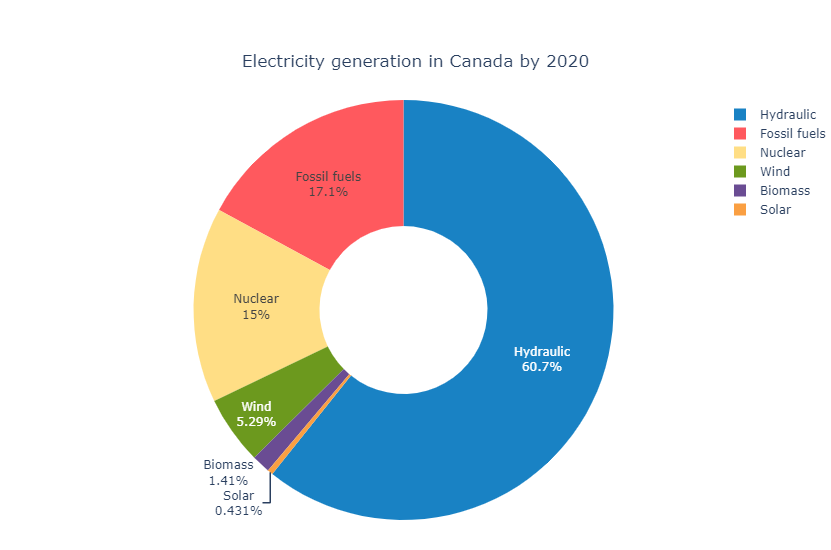

In [19]:
fig = px.pie(values=canada_2020, names=canada_2020.index, color=canada_2020.index,
             title='Electricity generation in Canada by 2020', width=700, height=550,
             color_discrete_map = {'Fossil fuels':'#FF595E', 'Hydraulic':'#1982C4', 'Nuclear':'#FFDE85', 'Wind':'#6C991E', 
                                   'Biomass':'#6A4C93', 'Solar':'#FA9F42'}, hole=.4, custom_data=[canada_2020.index])
fig.update_traces(textinfo='percent+label')
fig.update_traces(
    hovertemplate="<b>Generation: %{value} GW/H<extra></extra>")
fig.update_layout(
    title={
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.update_layout(margin={'r':30, "b":30, 'l':0})
plotly.offline.iplot(fig, filename='electricity_proportion')

The main source of electricity generation in Canada by 2020 is the Hydraulic sector, accounting for 60% of all electricity being generated in Canada. The following source is the Fossil fuels with up to 17% and the third main generation source is Nuclear. 

The other renewables have less impact in Canada's electricity generation, as in combination they make up to 7% of all generation, with Wind as the main renewable besides Hydro.

Taking all renewables together, they account for 68% of all electricity generation in Canada, making it a country with more than half of its generation renewable.

### Canada's electricity generation through time 
For the analysis of how the production of energy has changed from 1950 to 2019, we are going to generate an area chart of the electricity generation by source. The renewables that are not hydraulic will be combined in the plot for a better display. 

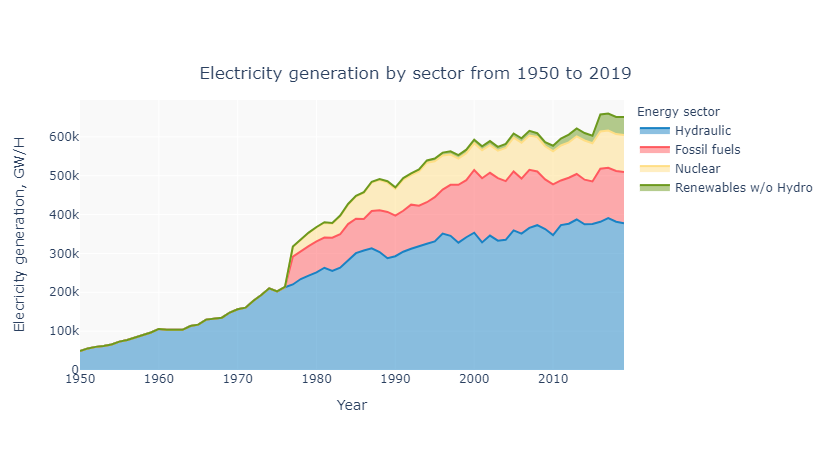

In [20]:
fig = px.area(energy50_19, x=energy50_19.index, 
              y=['Hydraulic', 'Fossil fuels','Nuclear', 'Renewables w/o Hydro'],
             color_discrete_map={'Fossil fuels':'#FF595E', 'Hydraulic':'#1982C4', 'Nuclear':'#FFDE85', 'Renewables w/o Hydro':'#6C991E'},
             title='Electricity generation by sector from 1950 to 2019', labels={'variable':'Energy sector'})

fig.update_traces(
    hovertemplate='<b>%{fullData.name}:%{y}<extra></extra>')

fig.update_layout(xaxis={'title':'Year'},
                  yaxis={'title':'Elecricity generation, GW/H'},
                  title={
                        'y':0.85,
                        'x':0.5,
                        'xanchor': 'center',
                        'yanchor': 'top'},
                  plot_bgcolor="#F9F9F9",
                  hovermode='x')

plotly.offline.iplot(fig, filename='electricity_time')

As it can be seen in the graph above, the hydraulic source has always been the main source of electricity generation in Canada, and it has just grown bigger from 1950 to 2019, picking in 2017 with a generation of 390,000 Gigawatts/hour.

The generation of electricity from fossil fuels started in 1977, and since that time it has remained as the second source of electricity in Canada. The pick of electricity being generated by fossil fuels was in the first half of the 2000s decade and it repicked in the last three years.

The nuclear electricity generation also started in 1977, and it grow at a slow rate until 1994, with a pick of 101,000 Gigawatts/hour, after that it has had downs and rises but overall has been constant in its generation. 

The renewable electricity generation without Hydraulic has been pretty low (less than 15,000 GW/H) prior to 2010. But it increased dramatically in 2016, more than double. Let's dig more in what was the reason of this big change by plotting only the electricity generation of the renewables over time.

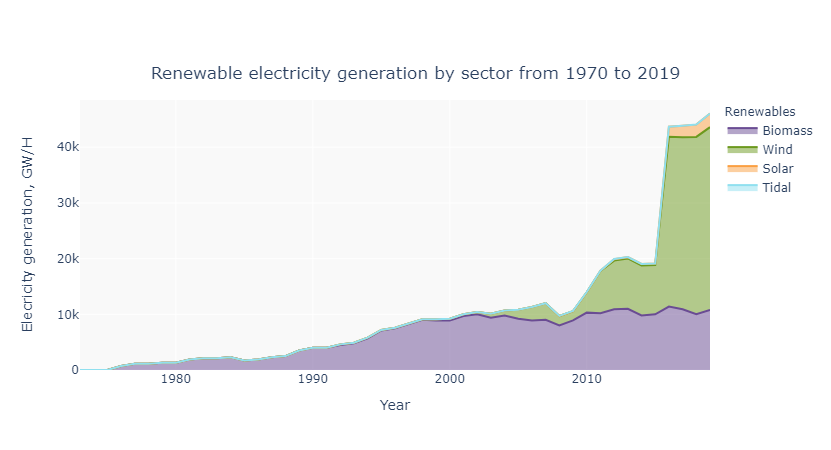

In [21]:
fig = px.area(energy50_19.loc[1973:2019,:], x=energy50_19.loc[1973:2019,:].index, y=['Biomass','Wind','Solar','Tidal'],
             color_discrete_map= {'Wind':'#6C991E', 'Biomass':'#6A4C93', 'Solar':'#FA9F42', 'Tidal':'#90e0ef'},
             title='Renewable electricity generation by sector from 1970 to 2019', labels={'variable':'Renewables'})

fig.update_traces(
    hovertemplate='<b>%{fullData.name}:%{y}<extra></extra>')

fig.update_layout(xaxis={'title':'Year'},
                  yaxis={'title':'Elecricity generation, GW/H'},
                  title={
                        'y':0.85,
                        'x':0.5,
                        'xanchor': 'center',
                        'yanchor': 'top'},
                  plot_bgcolor="#F9F9F9",
                  hovermode='x')

plotly.offline.iplot(fig, filename='electricity_renew_time')

The big increase of electricity produced by renewables is due Wind turbines, as we can see above, this sector tripled its generation in just one year (2016). With that increased, Wind became the second most important renewable in Canada, just behind Hydraulic.

Biomass is the third most important renewable, and it started their generation in 1974. The Biomass sector grew constantly until 2002, when after that has made a plateau around 10,000 Gigawatts/Hour. 

Solar in the other hand, started in 2011 to produce significant amounts of electricity but it was until 2016, as with Wind, when the sector increased their generation up to 2,000 Gigawatts/Hour. 

The other renewable source of electricity in this study is Tidal, this source of energy never has generated big amounts of electricity, with its top of generation at 27 Gigawatts/Hour. In 2019, the only Tidal energy plant in Canada was shut down, leading to no more electricity coming from this kind of source.



### Provincial electricity generation by 2020

For the province electricity generation analysis, we are going to focus on three factors: Total generation per province, most important source of energy per province and the most important renewable besides Hydraulic per province. 

To do this, we are going to create three choropleth maps, one for each factor. The choropleth map needs a json file with the shape and coordinates of the provinces. The json file can be found in the Github repository. 

But before we create the maps, we need to determine which source of energy it is the main for each province and also the main renewable. 



In [22]:
# function to classify the provinces by the most important energy source
def principal_energy(df):
    df = df[['Fossil fuels', 'Hydraulic', 'Nuclear', 'Wind', 'Biomass', 'Solar']]
    if df.max() == df['Hydraulic']:
        return 'Hydraulic'
    elif df.max() == df['Nuclear']:
        return 'Nuclear'
    elif df.max() == df['Solar']:
        return 'Solar'
    elif df.max() == df['Fossil fuels']:
        return 'Fossil fuels'
    elif df.max() == df['Wind']:
        return 'Wind'
    elif df.max() == df['Biomass']:
        return 'Biomass'
    
# function to classify the provinces by the most important renewable
def principal_renewables(df):
    if df[['Solar', 'Wind', 'Biomass']].max() == df['Wind']:
        return 'Wind'
    if df[['Solar', 'Wind', 'Biomass']].max() == df['Solar']:
        return 'Solar'
    if df[['Solar', 'Wind', 'Biomass']].max() == df['Biomass']:
        return 'Biomass'



In [23]:
provinces2020['Principal energy'] = provinces2020.apply(principal_energy, axis=1)
provinces2020['Principal renewables'] = provinces2020.apply(principal_renewables, axis=1)
provinces2020

Type of electricity generation,Hydraulic,Nuclear,Solar,Total generation,Biomass,Fossil fuels,Wind,Principal energy,Principal renewables
GEO,,,,,,,,,
Alberta,1514.044,0.000,16.415,42857.626,1000.989,37562.110,2732.800,Fossil fuels,Wind
British Columbia,35409.472,0.000,1.101,40120.157,2308.299,1007.094,1394.191,Hydraulic,Biomass
Manitoba,21659.904,0.000,0.078,22287.490,54.809,15.178,557.521,Hydraulic,Wind
New Brunswick,1787.460,3389.326,0.000,7475.164,342.069,1461.500,494.809,Nuclear,Wind
Newfoundland and Labrador,23579.771,0.000,0.000,24671.703,24.211,969.469,98.252,Hydraulic,Wind
Northwest Territories,149.347,0.000,1.068,415.402,0.000,253.624,11.363,Fossil fuels,Wind
Nova Scotia,574.698,0.000,0.000,5538.864,138.746,4301.031,524.389,Fossil fuels,Wind
Nunavut,0.000,0.000,0.000,113.278,0.000,113.278,0.000,Fossil fuels,Wind
Ontario,23781.531,52917.975,1593.856,93388.643,702.718,6903.783,7488.780,Nuclear,Wind


In [24]:
# import and store of the json file with the shapes. 
json_file = open(r'data/canada.json')
provinces = json.load(json_file)

#change of Yukon to match the json file
provinces2020.rename(index={'Yukon':'Yukon Territory'}, inplace=True)

#### Total generation per province

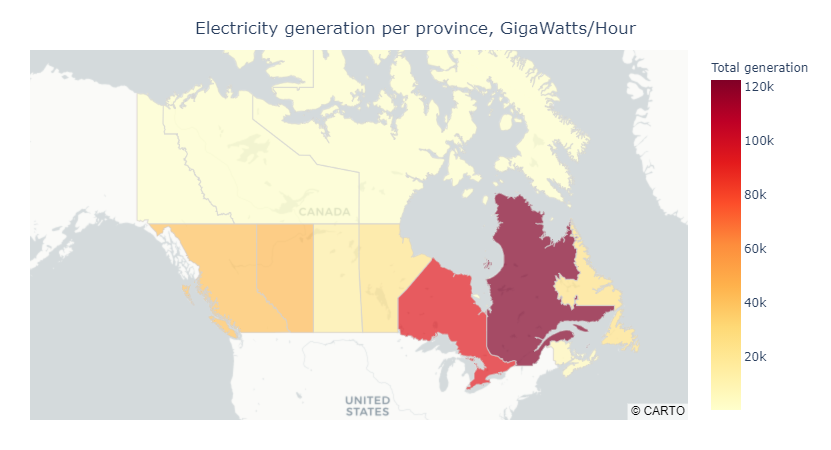

In [25]:
#palette = plotly.colors.make_colorscale(["#b7e4c7","#95d5b2","#74c69d","#52b788","#40916c","#2d6a4f","#1b4332"])
fig = px.choropleth_mapbox(provinces2020, geojson=provinces, color="Total generation",
                           locations=provinces2020.index, featureidkey="properties.name",
                           center={"lat": 59, "lon": -102},
                           mapbox_style="carto-positron", zoom=2, 
                           color_continuous_scale='YlOrRd',
                           opacity=.7,custom_data=[provinces2020.index, 'Principal energy','Total generation'],
                           title='Electricity generation per province, GigaWatts/Hour')
fig.update_layout(margin={"b":30,'l':30,'t':50})
fig.update_traces(
    hovertemplate='<b>%{customdata[0]}</b>' +  "<br>Generation: %{customdata[2]:,} GW/H" + "<br>Principal energy: %{customdata[1]}<extra></extra>")
fig.update_layout(title={
                        'y':0.95,
                        'x':0.5,
                        'xanchor': 'center',
                        'yanchor': 'top'})
fig.update_traces(marker_line_color='#D3D3D3')
plotly.offline.iplot(fig, filename='map_province')

The province with the biggest generation of electricity is Quebec, with around 122,000 Gigawatts/hour. It is followed by Ontario with 93,000 Gigawatts/hour. These two provinces make for 50% of all electricity generated in Canada so far in 2020, making East-Canada, the most important region in terms of electricity generation. 

The second region of importance in terms of electricity generation is Western Canada, with Alberta and British Columbia generating around 20% of the country electricity. 

The north and center provinces are the ones that produce less electricity for the country. 

#### Most important electricity sources per province

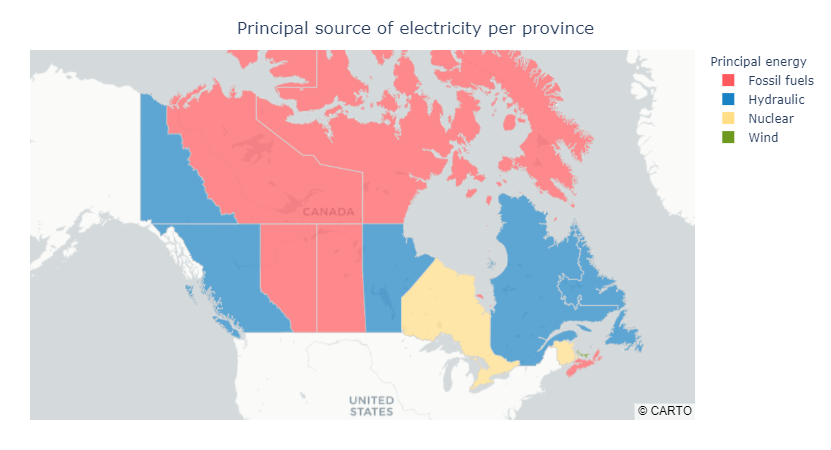

In [26]:
fig = px.choropleth_mapbox(provinces2020, geojson=provinces, color="Principal energy",
                           locations=provinces2020.index, featureidkey="properties.name",
                           center={"lat": 59, "lon": -102},
                           mapbox_style="carto-positron", zoom=2, 
                           color_discrete_map = {'Fossil fuels':'#FF595E', 'Hydraulic':'#1982C4', 'Nuclear':'#FFDE85', 'Wind':'#6C991E'},
                           opacity=.7,custom_data=[provinces2020.index, 'Principal energy', provinces2020.drop('Total generation',axis=1).max(axis=1)],
                           title='Principal source of electricity per province')
fig.update_layout(margin={"b":30,'l':30,'t':50})
fig.update_traces(
    hovertemplate='<b>%{customdata[0]}</b>' + "<br>Principal energy: %{customdata[1]}" + "<br>Generation: %{customdata[2]:,} GW/H<extra></extra>")
fig.update_layout(title={
                        'y':0.95,
                        'x':0.5,
                        'xanchor': 'center',
                        'yanchor': 'top'})
fig.update_traces(marker_line_color='#D3D3D3')
plotly.offline.iplot(fig, filename='map_province_type')

As seen in the map above, the electricity generation in Canada is really diverse in a per province basis, with Hydraulic and Fossil fuels being the most important source of electricity in 5 provinces each. And, this makes totally sense as Hydraulic is the biggest source of energy in the Country and Fossil fuels is the second. 

The other two most important sources are Nuclear, with two provinces, and Wind, being the most important source of electricity for Prince Edward Island province. 

#### Most important renewable energy sources per province (without Hydro)

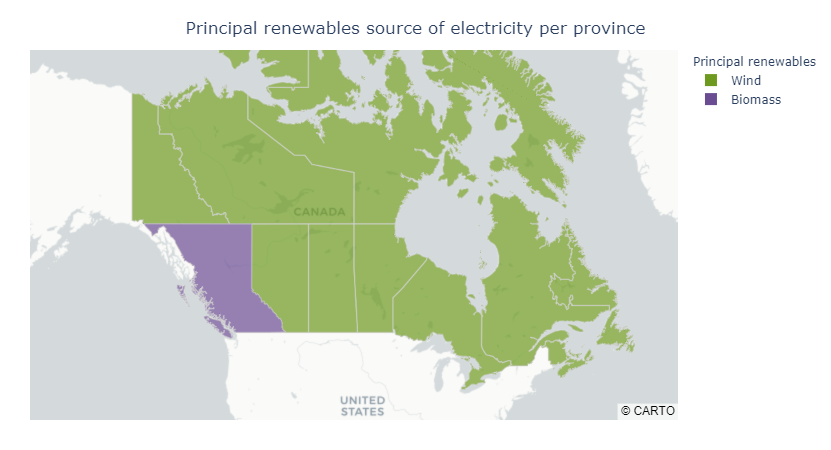

In [27]:
fig = px.choropleth_mapbox(provinces2020, geojson=provinces, color="Principal renewables",
                           locations=provinces2020.index, featureidkey="properties.name",
                           center={"lat": 59, "lon": -102},
                           mapbox_style="carto-positron", zoom=2, 
                           color_discrete_map = {'Wind':'#6C991E', 'Biomass':'#6A4C93' },
                           opacity=.7,custom_data=[provinces2020.index, 'Principal renewables', provinces2020.drop('Total generation',axis=1).max(axis=1)],
                           title='Principal renewables source of electricity per province')
fig.update_layout(margin={"b":30,'l':30,'t':50})
fig.update_traces(
    hovertemplate='<b>%{customdata[0]}</b>' + "<br>Principal energy: %{customdata[1]}" + "<br>Generation: %{customdata[2]:,} GW/H<extra></extra>")
fig.update_layout(title={
                        'y':0.95,
                        'x':0.5,
                        'xanchor': 'center',
                        'yanchor': 'top'})
fig.update_traces(marker_line_color='#D3D3D3')
plotly.offline.iplot(fig, filename='map_province_type_renew')

If we exclude Hydraulic generation, we end up with a map with not so much diversity in terms of renewable electricity sources. Almost in every province the most important renewable source is Wind, and this is in agreement with the fact that Wind is the second most important renewable in Canada.

The only province where Wind is not the main renewable source is in British Columbia, where the main renewable source of electricity in 2020 is Biomass. 

## Conclusion
It is a fact that Canada is a "green" country in terms of electricity generation, as around 68% percent of their generation comes from renewable sources, mainly Hydraulic and Wind. And this has been the standard for the country since the 50s, as the generation of electricity from Hydraulic sources has been growing from that year to today. 

The Wind sector, it has exploited on recent years and with new technology and investment, it will keep growing and becoming a more important source for the country. And, this apply also to solar energy, where there is a big room of develop that hasn't been really exploited.

As the threat of global warming and climate change is right in front of us, it is important to keep investing in renewables and decrease the use of fossil fuels as a source of energy, like in some of the provinces of the country. 